In [1]:
import numpy as np
import pandas as pd
import folium
import pandas_profiling
import matplotlib as mpl
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
%matplotlib inline
from tqdm import tqdm
import datetime
import json
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')

mpl.rc('font', family='Malgun Gothic')
mpl.rc('axes', unicode_minus=True)
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100
pd.options.display.float_format = '{:.5f}'.format

In [2]:
import io
from PIL import Image

In [3]:
path = 'C:/Users/user/Desktop/TodayLearn/TiL/Code/Project2/Projcet02/1_smart_card_data'
 
df = pd.read_csv(f'{path}/data/new_data.csv')

In [4]:
df1 = df.copy()

In [5]:
df1.shape

(1101709, 27)

# Ref. 사용함수 

##  total_distance 가 2km이내인 데이터를 정제.. find_circuity(data)

In [6]:
def find_circuity(data) :
    cond = (data['total_distance'] <= 2000)
    
    return data[cond]

def filter_circuity(data) :
    cond = (data['Circuity'] >= 1.5)
    
    return data[cond]
#df_sel_t2 = df_sel[(df_sel['total_time(m)'] <= 15) & ((df_sel['total_distance'] <= 2000) & (df_sel['total_distance'] > 1500))] 

## 이용승객 클러스터링

In [7]:
def clustering_whole(data) :
    import folium
    
    map = folium.Map(location = [data['on_lat'].median() , data['on_lon'].median()], zoom_start = 12)

    from folium.plugins import MarkerCluster
    marker_cluster = MarkerCluster().add_to(map)

    for lat, lon in zip(data['on_lat'],data['on_lon']) :
        folium.Marker([lat, lon]).add_to(marker_cluster)

    return map

# 탑승 경도, 위도 중심으로 클러스터링

In [8]:
def clustering_sub(data) :
    import folium

    map = folium.Map(location = [37.44757,127.05557], zoom_start = 12)

    from folium.plugins import MarkerCluster
    marker_cluster = MarkerCluster().add_to(map)

    for lat, lon in zip(data['on_lat'],data['on_lon']) :
        folium.Marker([lat, lon]).add_to(marker_cluster)

    for lat, lon in zip(data['off_lat'],data['off_lon']) :
        folium.Marker([lat, lon]).add_to(marker_cluster)

    return map

# 탑승, 하차 경도 위도 중심으로 클러스터링

In [83]:
def clustering_map(df_seocho_cir, on_time, off_time, n):
    
    
    from folium.plugins import MarkerCluster
    map = folium.Map(location = [df_seocho_cir['on_lat'].median() , df_seocho_cir['on_lon'].median()], zoom_start = 15, width='80%', height='80%')
    temp_df = df_seocho_cir[(df_seocho_cir['on_hour'] >= on_time) & (df_seocho_cir['on_hour'] <= off_time)]
    
    if (n <= 4) :
        temp_df = temp_df[temp_df['no_transfer'] == n]
        
    points1 = []
    points2 = []
    marker_cluster = MarkerCluster().add_to(map)
    for lat, lon in zip(temp_df['on_lat'], temp_df['on_lon']):
        points1.append([lat, lon])
        folium.Marker([lat, lon]).add_to(marker_cluster)

    for lat, lon in zip(temp_df['off_lat'], temp_df['off_lon']):
        points2.append([lat, lon])
        folium.Marker([lat, lon]).add_to(marker_cluster)

    # print(points1[:5], len(points1))
    # print(points2[:5], len(points2))

    total_ls = []
    for p1, p2 in zip(points1, points2):
        total_ls.append([p1, p2])
    
    ex2 = ['#666', '#fa7e1e', '#d62976', '#4f5bd5']
    
    ex = ['#499728', 'yellow', '#2793e8', '#cc181e']
    cc = []
    for cir in temp_df['Circuity'] :
        cc.append(cir)
    for idx, i in tqdm(enumerate(total_ls)):
        if (cc[idx] >=1.0) & (cc[idx] < 1.1):  
            folium.PolyLine(i, color=ex[0], smooth_factor=0.5).add_to(map)
        elif (cc[idx] >=1.1) & (cc[idx] < 1.2):
            folium.PolyLine(i, color=ex[1], smooth_factor=0.5).add_to(map)
        elif (cc[idx] >=1.2) & (cc[idx] < 1.3):
            folium.PolyLine(i, color=ex[2], smooth_factor=0.5).add_to(map)
        else:
            folium.PolyLine(i, color=ex[3], smooth_factor=0.5).add_to(map)
    map.save('map.png')
    return map

In [88]:
clustering_map(df_jungrang_cir, 10, 11, 5)

273it [00:00, 53679.86it/s]


In [14]:
def remove_outlier(data):
    q1, q3 = np.percentile(data, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - (iqr * 1.5)
    upper_bound = q3 + (iqr * 1.5)
    # print(q1, q3, lower_bound, upper_bound)
    
    mask = np.where((data<=upper_bound) & (data>=lower_bound), data, np.NaN)
    return mask

In [37]:
df1.drop('Unnamed: 0', axis = 1, inplace = True)

### 2.3.3. 중랑구의 대중교통 취약점 분석

In [38]:
df_jungrang = df1[df1['시군구명칭'] == '중랑구']
df_jungrang.shape

(163774, 26)

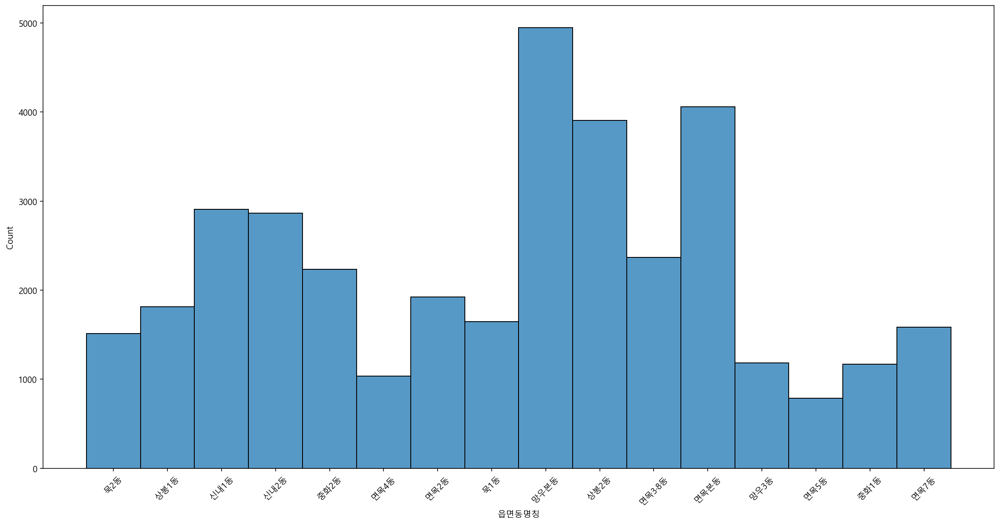

In [39]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.histplot(data = df_jungrang[df_jungrang['total_distance'] <= 2000], x = '읍면동명칭')
plt.show()

### - 중랑구 각 행정동의 우회계수 분포

In [40]:
df_jungrang.pivot_table(index = '읍면동명칭', values = 'Circuity', aggfunc = 'mean').T

읍면동명칭,망우3동,망우본동,면목2동,면목3·8동,면목4동,면목5동,면목7동,면목본동,묵1동,묵2동,상봉1동,상봉2동,신내1동,신내2동,중화1동,중화2동
Circuity,1.28585,1.30280,1.22715,1.27501,1.24222,1.25558,1.26746,1.29591,1.42239,1.24337,1.19290,1.22854,1.37713,1.29897,1.24953,1.27852


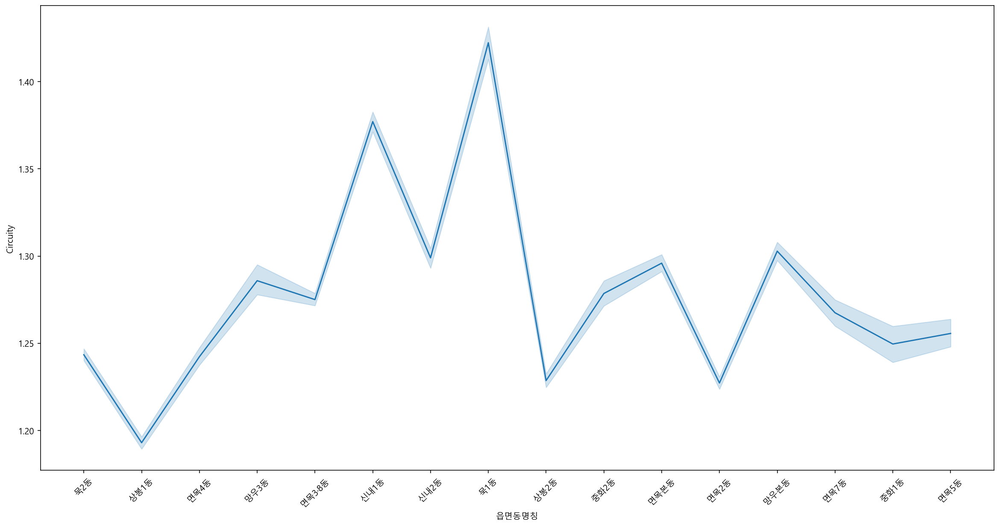

In [41]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.lineplot(data = df_jungrang, x = '읍면동명칭', y = 'Circuity')
plt.show()

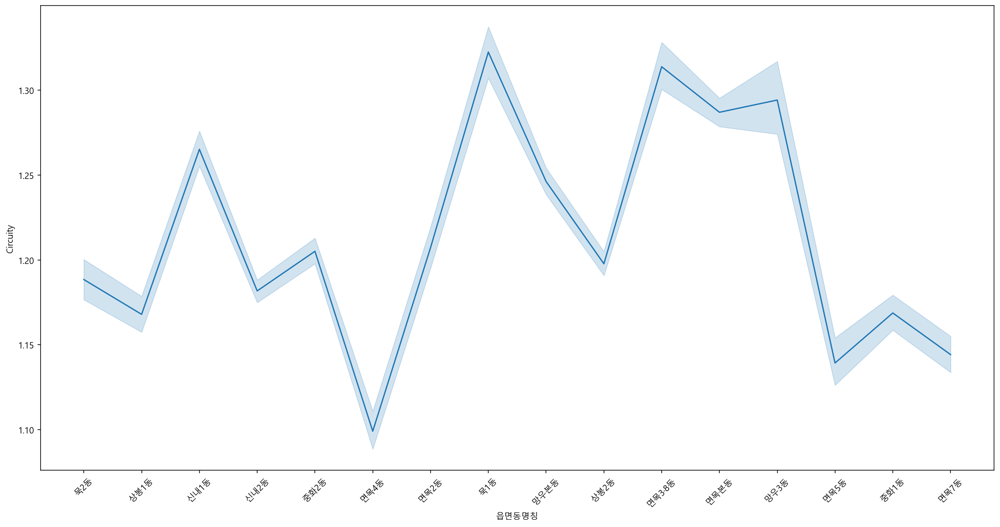

In [42]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.lineplot(data = df_jungrang[df_jungrang['total_distance'] <= 2000], x = '읍면동명칭', y = 'Circuity')
plt.show()

In [43]:
## 가설검정.. 이용 승객 수와 Circuity는 유의미한 관계가 있을까?

### 중랑구 각 행정동 시간별 승객 수 분포

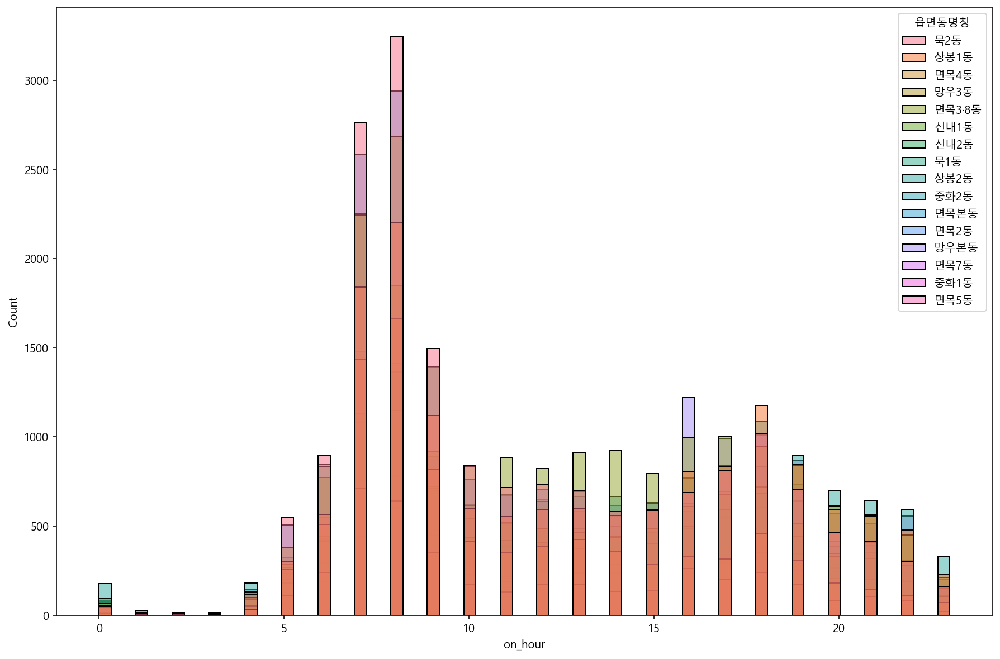

In [44]:
plt.figure(figsize = (15, 10))
sns.histplot(data= df_jungrang, x = 'on_hour', hue = '읍면동명칭')
plt.show()

In [45]:
### 해당 구의 버스-지하철만 타는 사람, 지하철 타는 사람, 버스만 타는 사람의 비율을 찾기

In [46]:
# only_sub = (data['Subway'] == True) & (data['Bus'] == False)
# only_bus = (data['Subway'] == False) & (data['Bus'] == True)
# both = (data['Subway'] == True) & (data['Bus'] == True)

In [47]:
only_sub = (df_jungrang['Subway'] == True) & (df_jungrang['Bus'] == False)
only_bus = (df_jungrang['Subway'] == False) & (df_jungrang['Bus'] == True)
both = (df_jungrang['Subway'] == True) & (df_jungrang['Bus'] == True)

In [48]:
sub1 = df_jungrang[only_sub]
bus1 = df_jungrang[only_bus]
snb = df_jungrang[both]

In [49]:
sub1[sub1['Circuity'] > 1.5].head(2)

,card_name,Bus,Subway,on_area_name,on_lon,on_lat,on_dong,on_hour,on_minute,on_second,off_area_name,off_lon,off_lat,off_dong,off_hour,off_minute,off_second,no_transfer,total_distance,total_time,route_id,Haversine,Circuity,total_time(m),시군구명칭,읍면동명칭
270,+/1ocBEpzsl33qoxqINfCuCckhjBf7SaTBzQYEQmamo=,False,True,용마산역,127.08682,37.57379,1107054,8,5,19,답십리역,127.05253,37.56695,1106091,8,19,11,0,4700,832,-1.00000,3116.49302,1.50811,13,중랑구,면목4동
296,+/84LatCranZGCBpo33zfjKLV4UYGvk4fDYLUT9xjQc=,False,True,용마산역,127.08682,37.57379,1107054,6,25,38,대청역,127.07950,37.49371,1123074,7,11,22,0,13600,2744,-1.00000,8927.76666,1.52334,45,중랑구,면목4동


In [50]:
ls_dong = list(set(list(df_jungrang['읍면동명칭'])))

ls_dong = ['면목3·8동', '면목2동', '면목4동', '면목5동', '면목7동', '묵1동', '묵2동', '상봉1동', '상봉2동', '망우본동', '망우3동', '신내1동', '신내2동', '중화1동','중화2동']
print(ls_dong)

['면목3·8동', '면목2동', '면목4동', '면목5동', '면목7동', '묵1동', '묵2동', '상봉1동', '상봉2동', '망우본동', '망우3동', '신내1동', '신내2동', '중화1동', '중화2동']


#### 4.3.3.1. 면목 3,8동 내 이용승객 분포

In [51]:
# 동별 필터링 함수
def filter_dong(data, n) :
    return data[data['읍면동명칭'] == ls_dong[n]]

In [52]:
df_meon_3=filter_dong(df_jungrang, 0)
df_meon_3.head(1)

,card_name,Bus,Subway,on_area_name,on_lon,on_lat,on_dong,on_hour,on_minute,on_second,off_area_name,off_lon,off_lat,off_dong,off_hour,off_minute,off_second,no_transfer,total_distance,total_time,route_id,Haversine,Circuity,total_time(m),시군구명칭,읍면동명칭
29,++89zFG0lK5dMybW14R1nqnvHWwZABYlgLGUHp/H+2U=,False,True,사가정역,127.08849,37.58091,1107072,15,29,38,공릉역,127.07300,37.62555,1111079,15,49,57,0,5300,1219,-1.00000,5148.59278,1.02941,20,중랑구,면목3·8동


In [53]:
df_jungrang_cir = find_circuity(filter_dong(df_jungrang, 0))

print(df_jungrang_cir.shape)
df_jungrang_cir.head(2)

(2367, 26)


,card_name,Bus,Subway,on_area_name,on_lon,on_lat,on_dong,on_hour,on_minute,on_second,off_area_name,off_lon,off_lat,off_dong,off_hour,off_minute,off_second,no_transfer,total_distance,total_time,route_id,Haversine,Circuity,total_time(m),시군구명칭,읍면동명칭
434,+/j264m05saHkwfIQzHrEALxN0tnMAgzI4XGiqckY8A=,True,False,진로아파트앞.종점,127.10152,37.58775,1107072,8,15,11,면목역,127.08697,37.58831,1107071,8,24,24,0,1885,553,11110729.00000,1283.12993,1.46906,9,중랑구,면목3·8동
757,+0uDJlrTwHybe6uPNeIrvQv17OvFLYrlKnFUdjFs1ms=,False,True,사가정역,127.08849,37.58091,1107072,17,17,7,상봉역,127.08570,37.59573,1107059,17,27,54,0,1700,647,-1.00000,1666.19888,1.02029,10,중랑구,면목3·8동


* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

<AxesSubplot:xlabel='on_hour', ylabel='Count'>

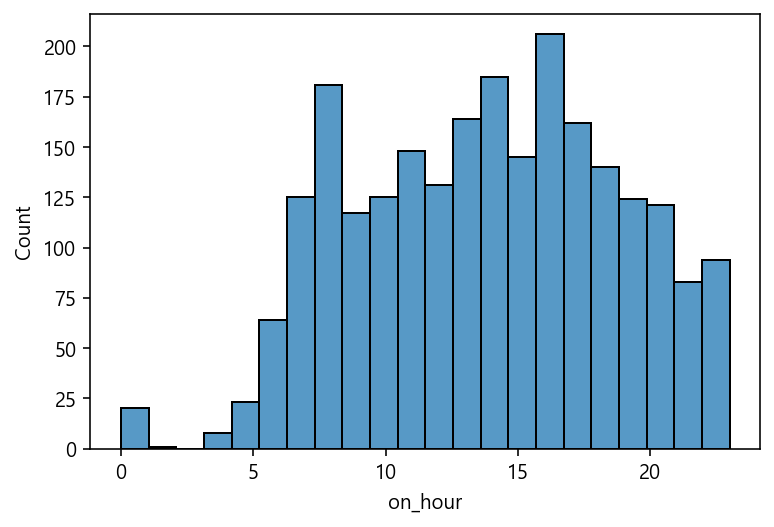

In [54]:
sns.histplot(data= df_jungrang_cir, x = 'on_hour')

In [55]:
clustering_whole(df_meon_3)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [34]:
clustering_map(df_jungrang_cir, 6, 24, 5)

2315it [00:00, 73863.60it/s]


* 상봉터미널(134건), 하나인쇄명함할인마트(216건), 서일대학교(500건 이상)

* 범위 조정한 데이터로 대중교통 도착한 사람

#### 4.3.3.2. 면목2동 내 이용승객 분포

In [35]:
df_meon_2=filter_dong(df_jungrang, 1)
df_meon_2.head(1)

,Unnamed: 0,card_name,Bus,Subway,on_area_name,on_lon,on_lat,on_dong,on_hour,on_minute,on_second,off_area_name,off_lon,off_lat,off_dong,off_hour,off_minute,off_second,no_transfer,total_distance,total_time,route_id,Haversine,Circuity,total_time(m),시군구명칭,읍면동명칭
91,779,++LhKC26878kHNZ7GPUJqBfUVVYxQ/D4XVMOpbgf7Wo=,False,True,면목역,127.08750,37.58870,1107052,13,53,27,둔촌동역,127.13618,37.52766,1125067,14,23,58,0,10200,1831,-1.00000,8029.45739,1.27032,30,중랑구,면목2동


In [36]:
df_jungrang_cir = find_circuity(filter_dong(df_jungrang, 1))

print(df_jungrang_cir.shape)
df_jungrang_cir.head(2)

(1925, 27)


,Unnamed: 0,card_name,Bus,Subway,on_area_name,on_lon,on_lat,on_dong,on_hour,on_minute,on_second,off_area_name,off_lon,off_lat,off_dong,off_hour,off_minute,off_second,no_transfer,total_distance,total_time,route_id,Haversine,Circuity,total_time(m),시군구명칭,읍면동명칭
259,2072,+/+4CX3xddrohHWLhHcIQSynZwFyGCO6RFygEc7Qi40=,True,False,중랑초등학교,127.07427,37.58951,1107052,11,33,27,삼육서울병원,127.06069,37.58969,1106073,11,38,37,0,1643,310,11110034.00000,1197.16502,1.37241,5,중랑구,면목2동
695,5365,+0cAbmJ5toHLZKLA7XfK63p92VLy2UBiy9EO++HX2nY=,True,False,한신아파트후문,127.07653,37.58738,1107052,13,11,3,지하철7호선면목역,127.08834,37.58846,1107071,13,19,25,0,1458,502,11110729.00000,1046.98188,1.39257,8,중랑구,면목2동


* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
clustering_whole(df_meon_2)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_jungrang_cir, 6, 24, 5)

* 면목공원 근처 7호선 면목역(151건), 중랑초등학교-면목한신아파트 근처(113건)

#### 4.3.3.3. 면목4동 내 이용승객 분포

In [ ]:
df_meon_4=filter_dong(df_jungrang, 2)
df_meon_4.head()

In [ ]:
df_jungrang_cir = find_circuity(filter_dong(df_jungrang, 2))

print(df_jungrang_cir.shape)
df_jungrang_cir.head(2)

* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
clustering_whole(df_meon_4)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_jungrang_cir, 6, 24, 5)

#### 4.3.3.4. 면목5동 내 이용승객 분포

In [ ]:
df_meon_5=filter_dong(df_jungrang, 3)
df_meon_5.head(1)

In [ ]:
df_jungrang_cir = find_circuity(filter_dong(df_jungrang, 3))

print(df_jungrang_cir.shape)
df_jungrang_cir.head(2)

* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
clustering_whole(df_meon_5)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_jungrang_cir, 6, 24, 5)

#### 4.3.3.5. 면목7동 내 이용승객 분포

* 버스 노선 따라 돌아감. 장안교 건너서 가는 버스 노선

In [ ]:
df_meon_7=filter_dong(df_jungrang, 4)
df_meon_7.head(1)

In [ ]:
df_jungrang_cir = find_circuity(filter_dong(df_jungrang, 4))

print(df_jungrang_cir.shape)
df_jungrang_cir.head(2)

* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
clustering_whole(df_meon_7)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_jungrang_cir, 6, 24, 5)

#### 4.3.3.6. 면목본동 내 이용승객 분포

In [ ]:
df_joong_meonbon=df_joong[df_joong['읍면동명칭']==Is_dong[11]]
print(df_joong_meonbon.shape)
df_joong_meonbon.head()

In [ ]:
df_joong_meonbon_cir=find_circuity(df_joong_meonbon)

print(df_joong_meonbon_cir.shape)
df_joong_meonbon_cir.head()

In [ ]:
clustering_whole(df_joong_meonbon)

In [ ]:
clustering_sub(df_joong_meonbon_cir)

* 서일대학교 주변(300건 이상), 서울중목초등학교 앞/면목한신아파트 앞(100건 이상), 지하철 7호선 면목역-하나인쇄명함할인마트(719건)

#### 4.3.3.7. 묵1동 내 이용승객 분포

In [ ]:
df_joong_mook1=df_joong[df_joong['읍면동명칭']==Is_dong[5]]
print(df_joong_mook1.shape)
df_joong_mook1.head()

In [ ]:
df_joong_mook1_cir=find_circuity(df_joong_mook1)

print(df_joong_mook1_cir.shape)
df_joong_mook1_cir.head()

In [ ]:
clustering_whole(df_joong_mook1)

In [ ]:
clustering_sub(df_joong_mook1_cir)

* 봉화산을 둘러서 가야하니까 우회계수 높음.

#### 4.3.3.8. 묵2동 내 이용승객 분포

In [ ]:
df_mook_2 = filter_dong(df_jungrang, 6)
print(df_mook_2.shape)
df_mook_2.head()

In [ ]:
sns.histplot(data = df_mook_2, x ='on_hour')

In [ ]:
df_jungrang_cir =filter_circuity(find_circuity(df_mook_2))

print(df_jungrang_cir.shape)
df_jungrang_cir.head()

In [ ]:
clustering_whole(df_mook_2)

In [ ]:
clustering_map(df_jungrang_cir, 6, 9, 5)

* 먹골역 주변, 화랑로 건너서 석계역 주변(100건 이상)

#### 4.3.3.9. 상봉1동 내 이용승객 분포

In [ ]:
df_joong_sang1=df_joong[df_joong['읍면동명칭']==Is_dong[1]]
print(df_joong_sang1.shape)
df_joong_sang1.head()

In [ ]:
df_joong_sang1_cir=find_circuity(df_joong_sang1)

print(df_joong_sang1_cir.shape)
df_joong_sang1_cir.head()

In [ ]:
clustering_whole(df_joong_sang1)

In [ ]:
clustering_sub(df_joong_sang1_cir)

* 상봉지하차도, 신내지하차도

#### 4.3.3.10. 상봉2동 내 이용승객 분포

In [ ]:
df_joong_sang2=df_joong[df_joong['읍면동명칭']==Is_dong[14]]
print(df_joong_sang2.shape)
df_joong_sang2.head()

In [ ]:
df_joong_sang2_cir=find_circuity(df_joong_sang2)

print(df_joong_sang2_cir.shape)
df_joong_sang2_cir.head()

In [ ]:
clustering_whole(df_joong_sang2)

In [ ]:
clustering_sub(df_joong_sang2_cir)

* 상봉터미널, 서일대학교

#### 4.3.3.11. 망우본동 내 이용승객 분포

In [ ]:
df_joong_mangbon=df_joong[df_joong['읍면동명칭']==Is_dong[0]]
print(df_joong_mangbon.shape)
df_joong_mangbon.head()

In [ ]:
df_joong_mangbon_cir=find_circuity(df_joong_mangbon)

print(df_joong_mangbon_cir.shape)
df_joong_mangbon_cir.head()

In [ ]:
clustering_whole(df_joong_mangbon)

In [ ]:
clustering_sub(df_joong_mangbon_cir)

* 중랑구청, 이화여대병설미디어고등학교, 송곡고등학교, 송곡여자중학교 근처에

#### 4.3.3.12. 망우3동 내 이용승객 분포

In [ ]:
df_joong_mang3=df_joong[df_joong['읍면동명칭']==Is_dong[7]]
print(df_joong_mang3.shape)
df_joong_mang3.head()

In [ ]:
df_joong_mang3_cir=find_circuity(df_joong_mang3)

print(df_joong_mang3_cir.shape)
df_joong_mang3_cir.head()

In [ ]:
clustering_whole(df_joong_mang3)

In [ ]:
clustering_sub(df_joong_mang3_cir)

* 면일초등학교, 혜원여자중고등학교 앞

#### 4.3.3.13. 신내1동 내 이용승객 분포

In [ ]:
df_joong_sin1=df_joong[df_joong['읍면동명칭']==Is_dong[9]]
print(df_joong_sin1.shape)
df_joong_sin1.head()

In [ ]:
df_joong_sin1_cir=find_circuity(df_joong_sin1)

print(df_joong_sin1_cir.shape)
df_joong_sin1_cir.head()

In [ ]:
clustering_whole(df_joong_sin1)

In [ ]:
clustering_sub(df_joong_sin1_cir)

* 봉화산, 신내차량사업소, 용마산로 거쳐서 가야함. 동성 1,2차 아파트, 데시앙 아파트 돌아서 가야함.

#### 4.3.3.14. 신내2동 내 이용승객 분포

In [ ]:
df_joong_sin2=df_joong[df_joong['읍면동명칭']==Is_dong[4]]
print(df_joong_sin2.shape)
df_joong_sin2.head()

In [ ]:
df_joong_sin2_cir=find_circuity(df_joong_sin2)

print(df_joong_sin2_cir.shape)
df_joong_sin2_cir.head()

In [ ]:
clustering_whole(df_joong_sin2)

In [ ]:
clustering_sub(df_joong_sin2_cir)

* 봉화산, 신내 단지 아파트 돌아서 가야함.

#### 4.3.3.15. 중화1동 내 이용승객 분포

In [ ]:
df_joong_joonghwa1=df_joong[df_joong['읍면동명칭']==Is_dong[13]]
print(df_joong_joonghwa1.shape)
df_joong_joonghwa1.head()

In [ ]:
df_joong_joonghwa1_cir=find_circuity(df_joong_joonghwa1)

print(df_joong_joonghwa1_cir.shape)
df_joong_joonghwa1_cir.head()

In [ ]:
clustering_whole(df_joong_joonghwa1)

In [ ]:
clustering_sub(df_joong_joonghwa1_cir)

* 코스트코, 홈플러스 앞, 장안중학교, 중흥초등학교, 7호선중화역 앞

#### 4.3.3.16. 중화2동 내 이용승객 분포

In [ ]:
df_joong_joonghwa2=df_joong[df_joong['읍면동명칭']==Is_dong[10]]
print(df_joong_joonghwa2.shape)
df_joong_joonghwa2.head()

In [ ]:
df_joong_joonghwa2_cir=find_circuity(df_joong_joonghwa2)

print(df_joong_joonghwa2_cir.shape)
df_joong_joonghwa2_cir.head()

In [ ]:
clustering_whole(df_joong_joonghwa2)

In [ ]:
clustering_sub(df_joong_joonghwa2_cir)

### 2.3.4. 서대문구의 대중교통 취약점 분석

In [ ]:
df_seodaemun = df1[df1['시군구명칭'] == '서대문구']
df_seodaemun.shape

In [ ]:
ls_dong = list(set(list(df_seodaemun['읍면동명칭'])))
ls_dong.sort()

print(ls_dong)

1. Circuity랑 거리의 기준 # 시각화를 곁들인 설명
2. 10분내외 2km ~ 5km 기준
3. 선으로 연결을 해서 ..
4. 환승 몇번 곁들여서 했는지.. 
5. 

In [ ]:
df_seodaemun = df1[df1['시군구명칭'] == '서대문구']
df_seodaemun.shape

In [ ]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.histplot(data = df_seodaemun, x = '읍면동명칭')
plt.show()

### - 중랑구 각 행정동의 우회계수 분포

In [ ]:
df_seodaemun.pivot_table(index = '읍면동명칭', values = 'Circuity', aggfunc = 'mean').T

In [ ]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.lineplot(data = df_seodaemun, x = '읍면동명칭', y = 'Circuity')
plt.show()

In [ ]:
## 가설검정.. 이용 승객 수와 Circuity는 유의미한 관계가 있을까?

### 서대문구 각 행정동 시간별 승객 수 분포

In [ ]:
plt.figure(figsize = (15, 10))
sns.histplot(data= df_seodaemun, x = 'on_hour', hue = '읍면동명칭')
plt.show()

In [ ]:
df_yangcheon = df1[df1['시군구명칭'] == '양천구']
df_yangcheon.shape

In [ ]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.histplot(data = df_yangcheon, x = '읍면동명칭')
plt.show()

### - 양천구 각 행정동의 우회계수 분포

In [ ]:
df_yangcheon.pivot_table(index = '읍면동명칭', values = 'Circuity', aggfunc = 'mean').T

In [ ]:
plt.figure(figsize = (20, 10))
plt.xticks(rotation = 45)
sns.lineplot(data = df_yangcheon, x = '읍면동명칭', y = 'Circuity')
plt.show()

In [ ]:
## 가설검정.. 이용 승객 수와 Circuity는 유의미한 관계가 있을까?

### 양천구 각 행정동 시간별 승객 수 분포

In [ ]:
plt.figure(figsize = (15, 10))
sns.histplot(data= df_yangcheon, x = 'on_hour', hue = '읍면동명칭')
plt.show()

In [ ]:
ls_dong = list(set(list(df_yangcheon['읍면동명칭'])))

ls_dong.sort()
print(ls_dong)

len(ls_dong)

In [ ]:
df_mok_1 =filter_dong(df_yangcheon, 0)
df_mok_1.head(1)

In [ ]:
df_yangcheon_cir = find_circuity(df_mok_1)

print(df_yangcheon_cir.shape)
df_yangcheon_cir.head(2)

* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
sns.histplot(data= df_mok_1, x = 'on_hour')

In [ ]:
clustering_whole(df_mok_1)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_yangcheon_cir, 6, 9, 5)

In [ ]:
df_sin_4=filter_dong(df_yangcheon, 15)
df_sin_4.head(1)

In [ ]:
df_yangcheon_cir = find_circuity(filter_dong(df_yangcheon, 15))

print(df_yangcheon_cir.shape)
df_yangcheon_cir.head(2)

* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
sns.histplot(data= df_sin_4, x = 'on_hour')

In [ ]:
clustering_whole(df_sin_4)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_yangcheon_cir, 6, 7, 5)

In [ ]:
df_sin_4=filter_dong(df_yangcheon, 15)
df_sin_4.head(1)

In [ ]:
df_yangcheon_cir = find_circuity(filter_dong(df_yangcheon, 15))

print(df_yangcheon_cir.shape)
df_yangcheon_cir.head(2)

* 우회계수가 높은 지역에 온디맨드 서비스가 필요할 것이고, 거리는 이 프로젝트에서 하고자 하는 온디맨드 서비스 즉, 전동 퀵보드와 같은 짧은 거리에서 유용하게 사용할 것 같은 온디맨드 서비스를 제공하기 위해 2km로 제한함.

In [ ]:
sns.histplot(data= df_sin_4, x = 'on_hour')

In [ ]:
clustering_whole(df_sin_4)

* 범위 조정한 데이터로 대중교통 이용한 사람, 도착한 사람

In [ ]:
clustering_map(df_yangcheon_cir, 6, 7, 5)